## Overview

This notebook will show you how to create and query a table or DataFrame that you uploaded to DBFS. [DBFS](https://docs.databricks.com/user-guide/dbfs-databricks-file-system.html) is a Databricks File System that allows you to store data for querying inside of Databricks. This notebook assumes that you have a file already inside of DBFS that you would like to read from.

This notebook is written in **Python** so the default cell type is Python. However, you can use different languages by using the `%LANGUAGE` syntax. Python, Scala, SQL, and R are all supported.

In [0]:
# File location and type
file_location = "/FileStore/tables/retail_data__1_.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01T07:45:00.000+0000,6.95,13085,United Kingdom
489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01T07:45:00.000+0000,6.75,13085,United Kingdom
489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01T07:45:00.000+0000,6.75,13085,United Kingdom
489434,22041,"""RECORD FRAME 7"""" SINGLE SIZE """,48,2009-12-01T07:45:00.000+0000,2.1,13085,United Kingdom
489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01T07:45:00.000+0000,1.25,13085,United Kingdom
489434,22064,PINK DOUGHNUT TRINKET POT,24,2009-12-01T07:45:00.000+0000,1.65,13085,United Kingdom
489434,21871,SAVE THE PLANET MUG,24,2009-12-01T07:45:00.000+0000,1.25,13085,United Kingdom
489434,21523,FANCY FONT HOME SWEET HOME DOORMAT,10,2009-12-01T07:45:00.000+0000,5.95,13085,United Kingdom
489435,22350,CAT BOWL,12,2009-12-01T07:46:00.000+0000,2.55,13085,United Kingdom
489435,22349,"DOG BOWL , CHASING BALL DESIGN",12,2009-12-01T07:46:00.000+0000,3.75,13085,United Kingdom


In [0]:
# Create a view or table

temp_table_name = "retail_data_analytics"

df.createOrReplaceTempView(temp_table_name)

In [0]:
%sql

/* Query the created temp table in a SQL cell */

select * from `retail_data_analytics`

invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01T07:45:00.000+0000,6.95,13085,United Kingdom
489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01T07:45:00.000+0000,6.75,13085,United Kingdom
489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01T07:45:00.000+0000,6.75,13085,United Kingdom
489434,22041,"""RECORD FRAME 7"""" SINGLE SIZE """,48,2009-12-01T07:45:00.000+0000,2.1,13085,United Kingdom
489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01T07:45:00.000+0000,1.25,13085,United Kingdom
489434,22064,PINK DOUGHNUT TRINKET POT,24,2009-12-01T07:45:00.000+0000,1.65,13085,United Kingdom
489434,21871,SAVE THE PLANET MUG,24,2009-12-01T07:45:00.000+0000,1.25,13085,United Kingdom
489434,21523,FANCY FONT HOME SWEET HOME DOORMAT,10,2009-12-01T07:45:00.000+0000,5.95,13085,United Kingdom
489435,22350,CAT BOWL,12,2009-12-01T07:46:00.000+0000,2.55,13085,United Kingdom
489435,22349,"DOG BOWL , CHASING BALL DESIGN",12,2009-12-01T07:46:00.000+0000,3.75,13085,United Kingdom


In [0]:
# With this registered as a temp view, it will only be available to this particular notebook. If you'd like other users to be able to query this table, you can also create a table from the DataFrame.
# Once saved, this table will persist across cluster restarts as well as allow various users across different notebooks to query this data.
# To do so, choose your table name and uncomment the bottom line.

permanent_table_name = "retail_data_analytics"

# df.write.format("parquet").saveAsTable(permanent_table_name)

In [0]:
%sql
show tables

database,tableName,isTemporary
default,diamonds,false
,retail_data_analytics,true


In [0]:
%sql
describe formatted retail_data_analytics

col_name,data_type,comment
invoice_no,string,null
stock_code,string,null
description,string,null
quantity,int,null
invoice_date,timestamp,null
unit_price,double,null
customer_id,int,null
country,string,null


## Total Invoice Amount Distribution

In [0]:

from pyspark.sql import functions as F

# Calculate the invoice amount by grouping by 'invoice_no' and summing the product of 'quantity' and 'unit_price'
invoice_amount_df = df.groupBy("invoice_no").agg(
    F.sum(F.col("quantity") * F.col("unit_price")).alias("invoice_amount")
)

# Show the result
invoice_amount_df.show()


+----------+-------------------+
|invoice_no|     invoice_amount|
+----------+-------------------+
|    489677|              192.0|
|   C491017|              -4.95|
|    491045|              303.2|
|    491658| 155.05999999999997|
|   C491705|              -22.5|
|   C492541|              -99.0|
|   C493168|-177.60000000000002|
|    493542|             118.75|
|    493977|             275.95|
|   C493984|             -10.43|
|    494244|             6711.0|
|    494277|            1335.92|
|   C494502|              -9.95|
|    495185|            2507.06|
|    495329|                0.0|
|    495594|                0.0|
|   C495697|-126.24999999999999|
|    495783|              48.96|
|    496171| 199.29999999999998|
|    496233| 188.82999999999998|
+----------+-------------------+
only showing top 20 rows



In [0]:
display(invoice_amount_df)

invoice_no,invoice_amount
489677,192.0
C491017,-4.95
491045,303.2
491658,155.05999999999997
C491705,-22.5
C492541,-99.0
C493168,-177.60000000000002
493542,118.75
493977,275.95
C493984,-10.43


In [0]:
# Filter the DataFrame to include only positive invoice amounts
positive_invoice_amount_df = invoice_amount_df.filter(F.col("invoice_amount") > 0)

# Show the result
positive_invoice_amount_df.show()

+----------+------------------+
|invoice_no|    invoice_amount|
+----------+------------------+
|    489677|             192.0|
|    491045|             303.2|
|    491658|155.05999999999997|
|    493542|            118.75|
|    493977|            275.95|
|    494244|            6711.0|
|    494277|           1335.92|
|    495185|           2507.06|
|    495783|             48.96|
|    496171|199.29999999999998|
|    496233|188.82999999999998|
|    496427|291.14000000000004|
|    497229| 312.5899999999999|
|    498070|207.15000000000006|
|    498125|190.95000000000005|
|    498328|            275.04|
|    498934|             899.0|
|    500148|431.59000000000015|
|    500253|             18.85|
|    500903|           2655.96|
+----------+------------------+
only showing top 20 rows



In [0]:
invoice_amount_df.describe

Out[10]: <bound method DataFrame.describe of DataFrame[invoice_no: string, invoice_amount: double]>

In [0]:
display(positive_invoice_amount_df)

invoice_no,invoice_amount
489677,192.0
491045,303.2
491658,155.05999999999997
493542,118.75
493977,275.95
494244,6711.0
494277,1335.92
495185,2507.06
495783,48.96
496171,199.29999999999998


In [0]:
statistics_df = positive_invoice_amount_df.agg(
    F.min("invoice_amount").alias("min_amount"),
    F.max("invoice_amount").alias("max_amount"),
    F.mean("invoice_amount").alias("mean_amount"),
    F.expr("percentile_approx(invoice_amount, 0.5)").alias("median_amount")).collect()[0]
print(statistics_df)

Row(min_amount=0.19, max_amount=168469.6, mean_amount=523.3037608663116, median_amount=304.31)


## Distribution of invoice amount with min, max, median, mod, and mean

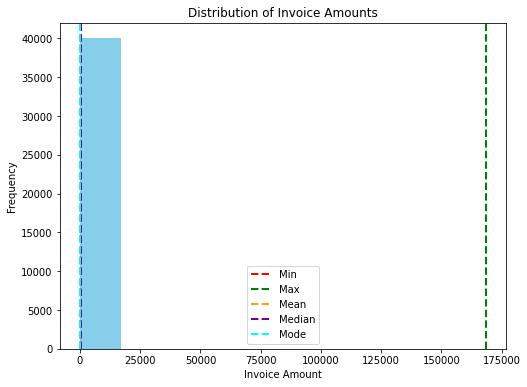

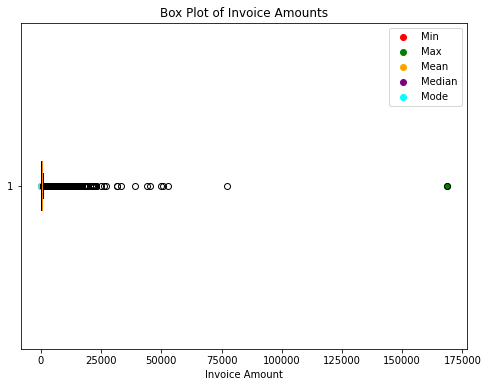

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql import functions as F


# Calculate the statistics for the visualization
statistics_df = positive_invoice_amount_df.select(
    F.min("invoice_amount").alias("min_amount"),
    F.max("invoice_amount").alias("max_amount"),
    F.mean("invoice_amount").alias("mean_amount"),
    F.expr("percentile_approx(invoice_amount, 0.5)").alias("median_amount")
   
)

# Collect the statistics to the driver for visualization
statistics = statistics_df.collect()[0]

# Extract individual statistics from the Row object
min_amount = statistics["min_amount"]
max_amount = statistics["max_amount"]
mean_amount = statistics["mean_amount"]
median_amount = statistics["median_amount"]

# Calculate the mode using mode=15 (you can replace 15 with any other value as needed)
mode_amount = 15

# Collect the invoice amounts to the driver for plotting
invoice_amounts = positive_invoice_amount_df.select("invoice_amount").rdd.flatMap(lambda x: x).collect()

# Plotting the histogram
plt.figure(figsize=(8, 6))
plt.hist(invoice_amounts,  color='skyblue')
plt.axvline(x=min_amount, color='red', linestyle='dashed', linewidth=2, label='Min')
plt.axvline(x=max_amount, color='green', linestyle='dashed', linewidth=2, label='Max')
plt.axvline(x=mean_amount, color='orange', linestyle='dashed', linewidth=2, label='Mean')
plt.axvline(x=median_amount, color='purple', linestyle='dashed', linewidth=2, label='Median')
plt.axvline(x=mode_amount, color='cyan', linestyle='dashed', linewidth=2, label='Mode')
plt.xlabel("Invoice Amount")
plt.ylabel("Frequency")
plt.title("Distribution of Invoice Amounts")
plt.legend()
plt.show()

# Plotting the box plot
plt.figure(figsize=(8 ,6))
plt.boxplot(invoice_amounts, vert=False)
plt.scatter(min_amount, 1, marker='o', color='red', label='Min')
plt.scatter(max_amount, 1, marker='o', color='green', label='Max')
plt.scatter(mean_amount, 1, marker='o', color='orange', label='Mean')
plt.scatter(median_amount, 1, marker='o', color='purple', label='Median')
plt.scatter(mode_amount, 1, marker='o', color='cyan', label='Mode')
plt.xlabel("Invoice Amount")
plt.title("Box Plot of Invoice Amounts")
plt.legend()
plt.show()


## Removing outliers

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql import functions as F

# Calculate the IQR (Interquartile Range) for 'invoice_amount'
quantiles = positive_invoice_amount_df.approxQuantile("invoice_amount", [0.25, 0.5, 0.75], 0.01)
Q1, median, Q3 = quantiles[0], quantiles[1], quantiles[2]
IQR = Q3 - Q1

# Calculate the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Remove outliers from the DataFrame
outlier_filtered_df = positive_invoice_amount_df.filter(
    (F.col("invoice_amount") >= lower_bound) &
    (F.col("invoice_amount") <= upper_bound)
)

print(IQR,Q1,Q3)
print(lower_bound)
print(upper_bound)
outlier_filtered_df.show()

342.24 154.20000000000002 496.44
-359.15999999999997
1009.8
+----------+------------------+
|invoice_no|    invoice_amount|
+----------+------------------+
|    489677|             192.0|
|    491045|             303.2|
|    491658|155.05999999999997|
|    493542|            118.75|
|    493977|            275.95|
|    495783|             48.96|
|    496171|199.29999999999998|
|    496233|188.82999999999998|
|    496427|291.14000000000004|
|    497229| 312.5899999999999|
|    498070|207.15000000000006|
|    498125|190.95000000000005|
|    498328|            275.04|
|    498934|             899.0|
|    500148|431.59000000000015|
|    500253|             18.85|
|    500979|              11.9|
|    501046|             612.0|
|    502620|            172.35|
|    502860|106.96000000000001|
+----------+------------------+
only showing top 20 rows



In [0]:
from pyspark.sql import functions as F

# Calculate min, max, mode, and mean after removing outliers
min_value = outlier_filtered_df.select(F.min("invoice_amount")).collect()[0][0]
max_value = outlier_filtered_df.select(F.max("invoice_amount")).collect()[0][0]
mean_value = outlier_filtered_df.select(F.mean("invoice_amount")).collect()[0][0]
median_value = outlier_filtered_df.approxQuantile("invoice_amount", [0.5], 0.01)[0]  # 50th quantile is the median

print("Min: ", min_value)
print("Max: ", max_value)
print("Mean: ", mean_value)
print("Median: ", median_value)


Min:  0.19
Max:  1009.7999999999998
Mean:  308.8717451685536
Median:  278.76


## Distribution for the first 85 quantiles of the invoice amount data with min, max, median, mod, and mean

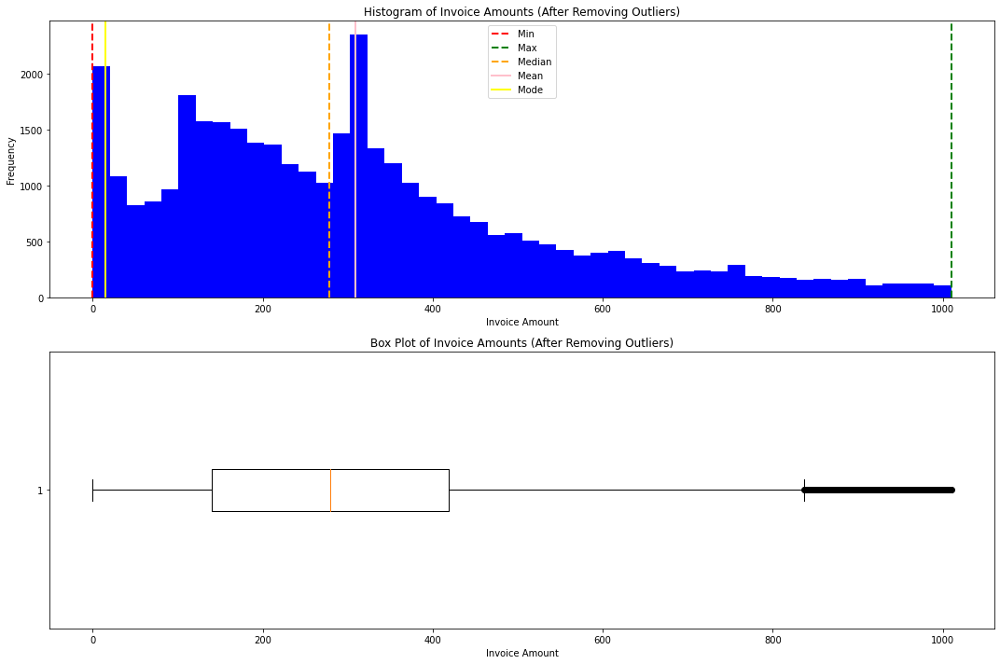

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql import functions as F

# we have a DataFrame named 'positive_invoice_amount_df' with the column 'invoice_amount'
# we have a DataFrame named 'outlier_filtered_df' with the column 'invoice_amount' after removing outliers

# # Calculate the first 85 quantiles of 'invoice_amount'
# quantiles = positive_invoice_amount_df.approxQuantile("invoice_amount", [i / 100 for i in range(1, 86)], 0.01)

# # Calculate min, max, median, and mean before removing outliers
# min_value_before = min(quantiles)
# max_value_before = max(quantiles)
# median_value_before = quantiles[42]  # 50th quantile is the median
# mean_value_before = sum(quantiles) / len(quantiles)

# Calculate min, max, median, and mean after removing outliers
min_value_after = outlier_filtered_df.select(F.min("invoice_amount")).collect()[0][0]
max_value_after = outlier_filtered_df.select(F.max("invoice_amount")).collect()[0][0]
median_value_after = outlier_filtered_df.approxQuantile("invoice_amount", [0.5], 0.01)[0]  # 50th quantile is the median
mean_value_after = outlier_filtered_df.select(F.mean("invoice_amount")).collect()[0][0]
mode = 15

# Plotting the histogram and box plot after removing outliers
plt.figure(figsize=(15, 10))

# Histogram after removing outliers
plt.subplot(2, 1, 1)
plt.hist(outlier_filtered_df.select("invoice_amount").rdd.flatMap(lambda x: x).collect(), bins=50, color='blue')
plt.axvline(x=min_value_after, color='red', linestyle='dashed', linewidth=2, label='Min')
plt.axvline(x=max_value_after, color='green', linestyle='dashed', linewidth=2, label='Max')
plt.axvline(x=median_value_after, color='orange', linestyle='dashed', linewidth=2, label='Median')
plt.axvline(x=mean_value_after, color='pink', linestyle='solid', linewidth=2, label='Mean')
plt.axvline(x=mode, color='yellow', linestyle='solid', linewidth=2, label='Mode')
plt.xlabel("Invoice Amount")
plt.ylabel("Frequency")
plt.title("Histogram of Invoice Amounts (After Removing Outliers)")
plt.legend()

# Box plot after removing outliers
plt.subplot(2, 1, 2)
plt.boxplot(outlier_filtered_df.select("invoice_amount").rdd.flatMap(lambda x: x).collect(), vert=False)
plt.xlabel("Invoice Amount")
plt.title("Box Plot of Invoice Amounts (After Removing Outliers)")

plt.tight_layout()
plt.show()


## Monthly Placed and Canceled Orders

In [0]:

from pyspark.sql import functions as F

# Create a new column 'year_month' with YYYYMM format
df = df.withColumn('year_month', F.concat(F.year('invoice_date'), F.lpad(F.month('invoice_date'), 2, '0')))

# Show the updated DataFrame with the new 'year_month' column
display(df)


invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country,year_month
489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01T07:45:00.000+0000,6.95,13085,United Kingdom,200912
489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01T07:45:00.000+0000,6.75,13085,United Kingdom,200912
489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01T07:45:00.000+0000,6.75,13085,United Kingdom,200912
489434,22041,"""RECORD FRAME 7"""" SINGLE SIZE """,48,2009-12-01T07:45:00.000+0000,2.1,13085,United Kingdom,200912
489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01T07:45:00.000+0000,1.25,13085,United Kingdom,200912
489434,22064,PINK DOUGHNUT TRINKET POT,24,2009-12-01T07:45:00.000+0000,1.65,13085,United Kingdom,200912
489434,21871,SAVE THE PLANET MUG,24,2009-12-01T07:45:00.000+0000,1.25,13085,United Kingdom,200912
489434,21523,FANCY FONT HOME SWEET HOME DOORMAT,10,2009-12-01T07:45:00.000+0000,5.95,13085,United Kingdom,200912
489435,22350,CAT BOWL,12,2009-12-01T07:46:00.000+0000,2.55,13085,United Kingdom,200912
489435,22349,"DOG BOWL , CHASING BALL DESIGN",12,2009-12-01T07:46:00.000+0000,3.75,13085,United Kingdom,200912


In [0]:

from pyspark.sql import functions as F



# Filter canceled orders (Quantity < 0)
canceled_orders_df = df.filter(F.col("quantity") < 0)

# Group by 'year_month' and count the distinct 'invoice_no' to get the unique canceled orders per month
monthly_canceled_df = canceled_orders_df.groupBy("year_month").agg(F.countDistinct("invoice_no").alias("canceled_orders")).orderBy("year_month")


# Show the result
monthly_canceled_df.show()


+----------+---------------+
|year_month|canceled_orders|
+----------+---------------+
|    200912|            491|
|    201001|            428|
|    201002|            687|
|    201003|            597|
|    201004|            379|
|    201005|            776|
|    201006|            497|
|    201007|            432|
|    201008|            366|
|    201009|            464|
|    201010|            594|
|    201011|            801|
|    201012|            396|
|    201101|            356|
|    201102|            267|
|    201103|            452|
|    201104|            426|
|    201105|            431|
|    201106|            436|
|    201107|            387|
+----------+---------------+
only showing top 20 rows



In [0]:

from pyspark.sql import functions as F

# Group by 'year_month' and count the distinct 'invoice_no' to get the total orders per month
monthly_total_orders_df = df.groupBy("year_month").agg(F.countDistinct("invoice_no").alias("total_orders")).orderBy("year_month")

# Show the result
monthly_total_orders_df.show()


+----------+------------+
|year_month|total_orders|
+----------+------------+
|    200912|        2330|
|    201001|        1633|
|    201002|        1969|
|    201003|        2367|
|    201004|        1892|
|    201005|        2418|
|    201006|        2216|
|    201007|        2017|
|    201008|        1877|
|    201009|        2375|
|    201010|        2965|
|    201011|        3669|
|    201012|        2025|
|    201101|        1476|
|    201102|        1393|
|    201103|        1983|
|    201104|        1744|
|    201105|        2162|
|    201106|        2012|
|    201107|        1927|
+----------+------------+
only showing top 20 rows



In [0]:
# Calculate total monthly orders 
monthly_total_orders_df = df.groupBy("year_month").agg(F.countDistinct("invoice_no").alias("total_orders")).orderBy("year_month")

# Calculate monthly canceled orders
monthly_canceled_orders_df = df.filter(F.col("quantity") < 0).groupBy("year_month").agg(F.countDistinct("invoice_no").alias("canceled_orders")).orderBy("year_month")

# Join the two DataFrames and calculate placed orders
placed_orders_df = monthly_total_orders_df.join(monthly_canceled_orders_df, "year_month", "left_outer") \
    .withColumn("placed_orders", F.col("total_orders") - 2 * F.coalesce(F.col("canceled_orders"), F.lit(0))).orderBy("year_month")

# Show the result
placed_orders_df.show()


+----------+------------+---------------+-------------+
|year_month|total_orders|canceled_orders|placed_orders|
+----------+------------+---------------+-------------+
|    200912|        2330|            491|         1348|
|    201001|        1633|            428|          777|
|    201002|        1969|            687|          595|
|    201003|        2367|            597|         1173|
|    201004|        1892|            379|         1134|
|    201005|        2418|            776|          866|
|    201006|        2216|            497|         1222|
|    201007|        2017|            432|         1153|
|    201008|        1877|            366|         1145|
|    201009|        2375|            464|         1447|
|    201010|        2965|            594|         1777|
|    201011|        3669|            801|         2067|
|    201012|        2025|            396|         1233|
|    201101|        1476|            356|          764|
|    201102|        1393|            267|       

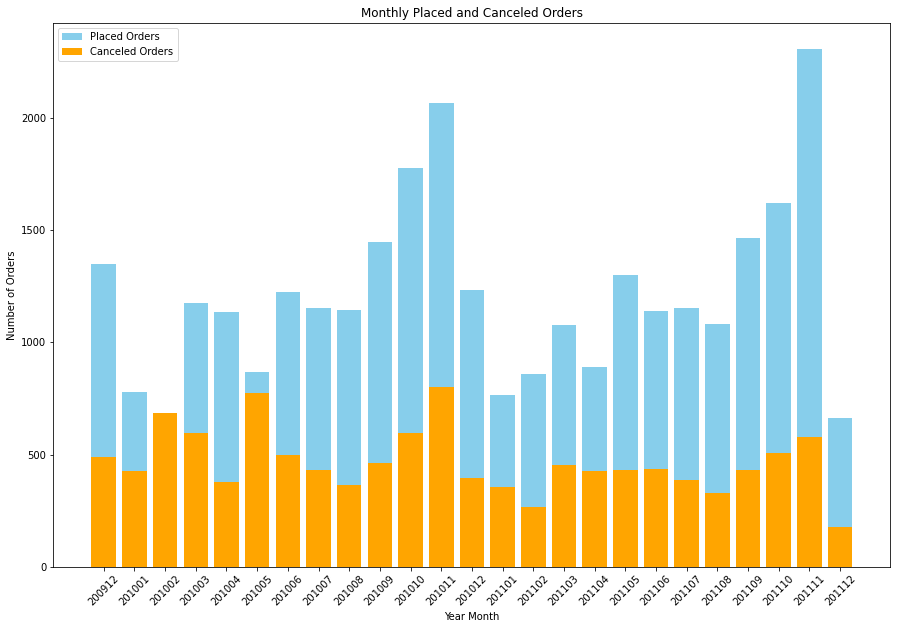

In [0]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
# Calculate total monthly orders 
monthly_total_orders_df = df.groupBy("year_month").agg(F.countDistinct("invoice_no").alias("total_orders")).orderBy("year_month")

# Calculate monthly canceled orders
monthly_canceled_orders_df = df.filter(F.col("quantity") < 0).groupBy("year_month").agg(F.countDistinct("invoice_no").alias("canceled_orders")).orderBy("year_month")

# Join the two DataFrames and calculate placed orders
monthly_placed_orders_df = monthly_total_orders_df.join(monthly_canceled_orders_df, "year_month", "left_outer") \
    .withColumn("placed_orders", F.col("total_orders") - 2 * F.coalesce(F.col("canceled_orders"), F.lit(0))).orderBy("year_month")

# Join placed and canceled orders dataframes with different column aliases
joined_df = monthly_placed_orders_df.join(monthly_canceled_orders_df.withColumnRenamed("canceled_orders", "canceled_orders_monthly"), "year_month", "outer").fillna(0)

# Sort the data by year_month
joined_df = joined_df.orderBy("year_month")

# Plot the bar chart
plt.figure(figsize=(15, 10))
plt.bar(joined_df.select("year_month").rdd.flatMap(lambda x: x).collect(),
        joined_df.select("placed_orders").rdd.flatMap(lambda x: x).collect(), 
        color='skyblue', label='Placed Orders')
plt.bar(joined_df.select("year_month").rdd.flatMap(lambda x: x).collect(),
        joined_df.select("canceled_orders_monthly").rdd.flatMap(lambda x: x).collect(),
        color='orange', label='Canceled Orders')
plt.xlabel('Year Month')
plt.ylabel('Number of Orders')
plt.title('Monthly Placed and Canceled Orders')
plt.legend()
plt.xticks(rotation=45)
# plt.grid(True)
plt.show()


## Monthly Sales

In [0]:
from pyspark.sql import functions as F

# Calculate the sales amount for each row (quantity * unit_price)
df = df.withColumn("sales_amount", F.col("quantity") * F.col("unit_price"))

# Group by year_month and calculate the total sales for each month
monthly_sales_df = df.groupBy("year_month").agg(F.sum("sales_amount").alias("total_sales"))

# Sort the data by year_month
monthly_sales_df = monthly_sales_df.orderBy("year_month")

# Show the result
monthly_sales_df.show()


+----------+------------------+
|year_month|       total_sales|
+----------+------------------+
|    200912| 799847.1100000143|
|    201001| 624032.8919999955|
|    201002| 533091.4260000042|
|    201003| 765848.7609999765|
|    201004| 590580.3919999823|
|    201005| 615322.8300000005|
|    201006| 679786.6099999842|
|    201007| 575236.3500000095|
|    201008| 656776.3299999854|
|    201009| 853650.4309999745|
|    201010|1045168.3199998983|
|    201011|1422654.6419998251|
|    201012|1126445.5099999434|
|    201101| 560000.2900000234|
|    201102|498062.65000002686|
|    201103| 683267.0800000189|
|    201104| 493207.1210000249|
|    201105|   723333.51000001|
|    201106| 691123.1200000228|
|    201107| 681300.1110000301|
+----------+------------------+
only showing top 20 rows



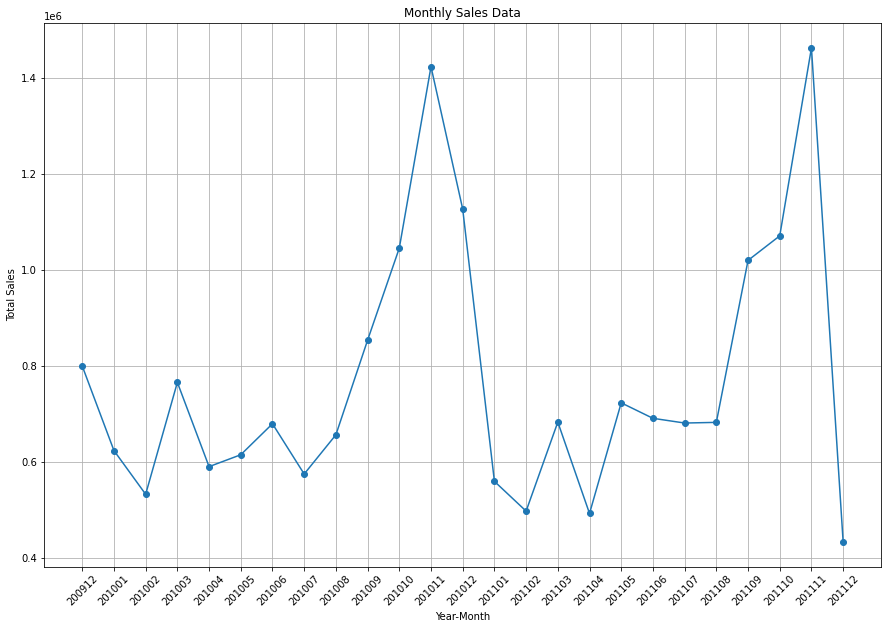

In [0]:
import matplotlib.pyplot as plt



# Sort the DataFrame by year_month in ascending order
monthly_sales_df = monthly_sales_df.orderBy("year_month")

# Extract the year_month and total_sales columns
year_month = monthly_sales_df.select("year_month").rdd.flatMap(lambda x: x).collect()
total_sales = monthly_sales_df.select("total_sales").rdd.flatMap(lambda x: x).collect()

# Create the line chart
plt.figure(figsize=(15, 10))
plt.plot(year_month, total_sales, marker='o', linestyle='-')
plt.xlabel("Year-Month")
plt.ylabel("Total Sales")
plt.title("Monthly Sales Data")
plt.xticks(rotation=45)
plt.grid(True)



## Monthly sales growth

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# Calculate the sales amount for each row (quantity * unit_price)
df = df.withColumn("sales_amount", F.col("quantity") * F.col("unit_price"))

# Group by year_month and calculate the total sales for each month
monthly_sales_df = df.groupBy("year_month").agg(F.sum("sales_amount").alias("total_sales"))

# Sort the data by year_month
monthly_sales_df = monthly_sales_df.orderBy("year_month")

# Calculate the sales percentage growth using a window function
windowSpec = Window.orderBy("year_month")
monthly_sales_df = monthly_sales_df.withColumn("sales_growth", (F.col("total_sales") / F.lag("total_sales", 1).over(windowSpec) - 1) * 100)

# Show the result
monthly_sales_df.show()


+----------+------------------+-------------------+
|year_month|       total_sales|       sales_growth|
+----------+------------------+-------------------+
|    200912| 799847.1100000143|               null|
|    201001| 624032.8919999955|-21.980978089677127|
|    201002| 533091.4260000042|-14.573184709627762|
|    201003| 765848.7609999765|  43.66180426994348|
|    201004| 590580.3919999823|-22.885506633339002|
|    201005| 615322.8300000005|  4.189512272195284|
|    201006| 679786.6099999842| 10.476416095268814|
|    201007| 575236.3500000095|-15.379864572498281|
|    201008| 656776.3299999854| 14.175039529399447|
|    201009| 853650.4309999745| 29.975821601243368|
|    201010|1045168.3199998983|    22.435165735883|
|    201011|1422654.6419998251|  36.11727554083954|
|    201012|1126445.5099999434|-20.820874107822874|
|    201101| 560000.2900000234| -50.28607375779308|
|    201102|498062.65000002686|-11.060287129493096|
|    201103| 683267.0800000189|  37.18496659004287|
|    201104|

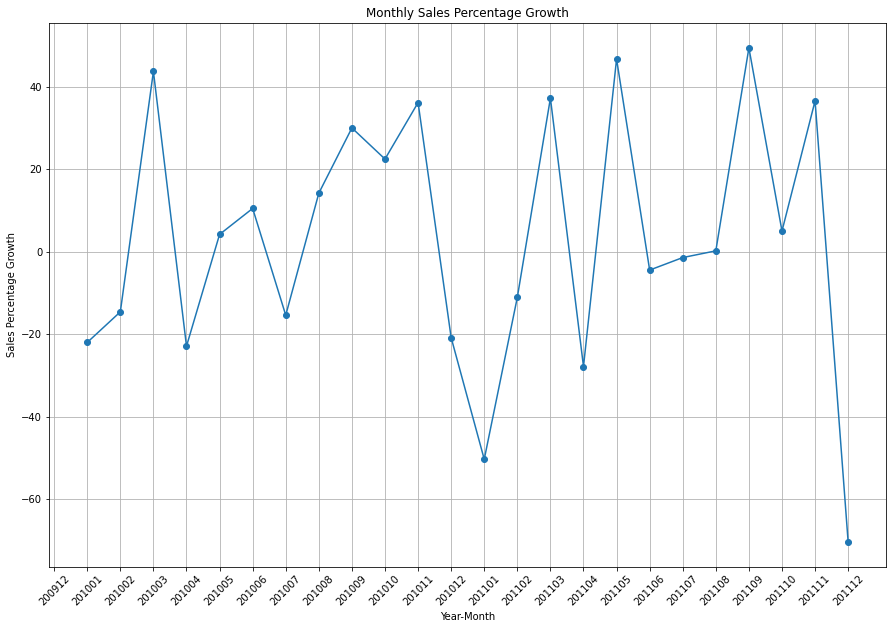

In [0]:
# Convert Spark DataFrame to Pandas DataFrame
pandas_df = monthly_sales_df.toPandas()

# Plot the line chart
plt.figure(figsize=(15, 10))
plt.plot(pandas_df["year_month"], pandas_df["sales_growth"], marker='o')
plt.xlabel("Year-Month")
plt.ylabel("Sales Percentage Growth")
plt.title("Monthly Sales Percentage Growth")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

## Monthly Active Users

In [0]:
from pyspark.sql import functions as F



# Create a new column "year_month" to represent the month and year
df = df.withColumn("year_month", F.date_format("invoice_date", "yyyyMM"))

# Group by "year_month" and count distinct customers
monthly_active_users_df =df.groupBy("year_month").agg(F.countDistinct("customer_id").alias("monthly_active_users")).orderBy("year_month")

# Show the result
monthly_active_users_df.show()


+----------+--------------------+
|year_month|monthly_active_users|
+----------+--------------------+
|    200912|                1045|
|    201001|                 786|
|    201002|                 807|
|    201003|                1111|
|    201004|                 998|
|    201005|                1062|
|    201006|                1095|
|    201007|                 988|
|    201008|                 964|
|    201009|                1202|
|    201010|                1577|
|    201011|                1683|
|    201012|                 948|
|    201101|                 783|
|    201102|                 798|
|    201103|                1020|
|    201104|                 899|
|    201105|                1079|
|    201106|                1051|
|    201107|                 993|
+----------+--------------------+
only showing top 20 rows



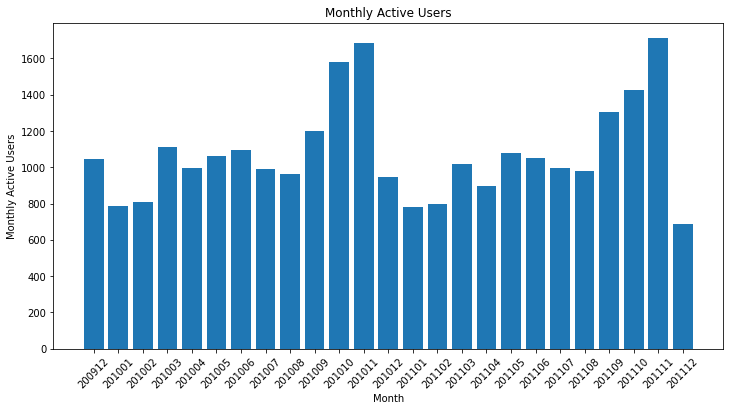

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql import functions as F



# Create a new column "year_month" to represent the month and year
df = df.withColumn("year_month", F.date_format("invoice_date", "yyyyMM"))

# Group by "year_month" and count distinct customers
monthly_active_users_df = df.groupBy("year_month").agg(F.countDistinct("customer_id").alias("monthly_active_users"))

# Sort the DataFrame by "year_month" to make sure the data is in chronological order
monthly_active_users_df = monthly_active_users_df.orderBy("year_month")

# Convert the DataFrame to Pandas DataFrame for plotting
pandas_df = monthly_active_users_df.toPandas()

# Plot the bar chart
plt.figure(figsize=(12, 6))
plt.bar(pandas_df["year_month"], pandas_df["monthly_active_users"])
plt.xlabel("Month")
plt.ylabel("Monthly Active Users")
plt.title("Monthly Active Users")
plt.xticks(rotation=45)
plt.show()


## New and Existing Users

In [0]:
from pyspark.sql import functions as F

# Calculate the sales amount for each row (quantity * unit_price)
df = df.withColumn("sales_amount", F.col("quantity") * F.col("unit_price"))

# Group by 'customer_id' and calculate the minimum 'invoice_date' for each customer (first purchase date)
first_purchase_df = df.groupBy("customer_id").agg(F.min("invoice_date").alias("purchase_date"))

# Create a new column 'year_month' with the 'purchase_date' in 'YYYYMM' format
first_purchase_df = first_purchase_df.withColumn("purchase_date", F.date_format("purchase_date", "yyyyMM"))

# Group by 'customer_id' and 'purchase_date' to remove duplicate customers
distinct_customers_df = first_purchase_df.groupBy("customer_id", "purchase_date").count()

# Show the result
distinct_customers_df.show()


+-----------+-------------+-----+
|customer_id|purchase_date|count|
+-----------+-------------+-----+
|      13623|       200912|    1|
|      17679|       200912|    1|
|      17389|       200912|    1|
|      18051|       200912|    1|
|      13289|       200912|    1|
|      17753|       201001|    1|
|      15727|       201001|    1|
|      16574|       201002|    1|
|      14832|       201003|    1|
|      15447|       201003|    1|
|      13285|       201003|    1|
|      14450|       201004|    1|
|      16503|       201006|    1|
|      12799|       201006|    1|
|      16861|       201007|    1|
|      15967|       200912|    1|
|      15254|       200912|    1|
|      12471|       200912|    1|
|      17172|       200912|    1|
|      14514|       200912|    1|
+-----------+-------------+-----+
only showing top 20 rows



In [0]:
from pyspark.sql import functions as F

# Convert 'InvoiceDate' to 'Purchase_Date' in 'YYYYMM' format
df = df.withColumn("Purchase_Date", F.date_format("invoice_date", "yyyyMM"))

# Group by 'Customer ID' and get the minimum 'Purchase_Date' for each customer (first purchase date)
first_purchase_dates = df.groupBy("customer_id").agg(F.min("Purchase_Date").alias("Purchase_Date"))

# Show the result
first_purchase_dates.show()


+-----------+-------------+
|customer_id|Purchase_Date|
+-----------+-------------+
|       null|       200912|
|      12346|       200912|
|      12347|       201010|
|      12348|       201009|
|      12349|       200912|
|      12350|       201102|
|      12351|       201011|
|      12352|       201011|
|      12353|       201010|
|      12354|       201104|
|      12355|       201005|
|      12356|       201010|
|      12357|       201011|
|      12358|       200912|
|      12359|       200912|
|      12360|       201002|
|      12361|       201001|
|      12362|       200912|
|      12363|       201104|
|      12364|       201108|
+-----------+-------------+
only showing top 20 rows



In [0]:
from pyspark.sql import functions as F

# Convert 'InvoiceDate' to 'Purchase_Date' in 'YYYYMM' format
df = df.withColumn("Purchase_Date", F.date_format("invoice_date", "yyyyMM"))

# Group by 'Purchase_Date' and get distinct 'Customer ID' for each date (new users)
new_users_df = first_purchase_dates.groupBy("Purchase_Date").agg(F.countDistinct("customer_id").alias("New_Users"))

# Order the result by 'Purchase_Date'
new_users_df = new_users_df.orderBy("Purchase_Date")

# Show the result
new_users_df.show()

+-------------+---------+
|Purchase_Date|New_Users|
+-------------+---------+
|       200912|     1045|
|       201001|      394|
|       201002|      363|
|       201003|      436|
|       201004|      291|
|       201005|      254|
|       201006|      269|
|       201007|      183|
|       201008|      158|
|       201009|      242|
|       201010|      379|
|       201011|      322|
|       201012|       77|
|       201101|       71|
|       201102|      123|
|       201103|      178|
|       201104|      105|
|       201105|      108|
|       201106|      108|
|       201107|      102|
+-------------+---------+
only showing top 20 rows



In [0]:

from pyspark.sql import functions as F


# Convert 'InvoiceDate' to 'Purchase_Date' in 'YYYYMM' format
df = df.withColumn("Purchase_Date", F.date_format("invoice_date", "yyyyMM"))

exist_users_df = df.groupBy("Purchase_Date").agg(F.countDistinct("customer_id").alias("Exist_Users")).orderBy("Purchase_Date")


exist_users_df.show()

+-------------+-----------+
|Purchase_Date|Exist_Users|
+-------------+-----------+
|       200912|       1045|
|       201001|        786|
|       201002|        807|
|       201003|       1111|
|       201004|        998|
|       201005|       1062|
|       201006|       1095|
|       201007|        988|
|       201008|        964|
|       201009|       1202|
|       201010|       1577|
|       201011|       1683|
|       201012|        948|
|       201101|        783|
|       201102|        798|
|       201103|       1020|
|       201104|        899|
|       201105|       1079|
|       201106|       1051|
|       201107|        993|
+-------------+-----------+
only showing top 20 rows



In [0]:

from pyspark.sql import functions as F

# Join the DataFrames on 'Purchase_Date'
joined_df = exist_users_df.alias("exist").join(new_users_df.alias("new"), "Purchase_Date", "left_outer")

# Calculate the count of old users (existing users - new users)
old_users_df = joined_df.withColumn("Old_User_Count", F.col("exist.Exist_Users") - F.col("new.New_Users")).select("Purchase_Date", "new.New_Users", "Old_User_Count").orderBy("Purchase_Date")



# Show the result
old_users_df.show()





+-------------+---------+--------------+
|Purchase_Date|New_Users|Old_User_Count|
+-------------+---------+--------------+
|       200912|     1045|             0|
|       201001|      394|           392|
|       201002|      363|           444|
|       201003|      436|           675|
|       201004|      291|           707|
|       201005|      254|           808|
|       201006|      269|           826|
|       201007|      183|           805|
|       201008|      158|           806|
|       201009|      242|           960|
|       201010|      379|          1198|
|       201011|      322|          1361|
|       201012|       77|           871|
|       201101|       71|           712|
|       201102|      123|           675|
|       201103|      178|           842|
|       201104|      105|           794|
|       201105|      108|           971|
|       201106|      108|           943|
|       201107|      102|           891|
+-------------+---------+--------------+
only showing top

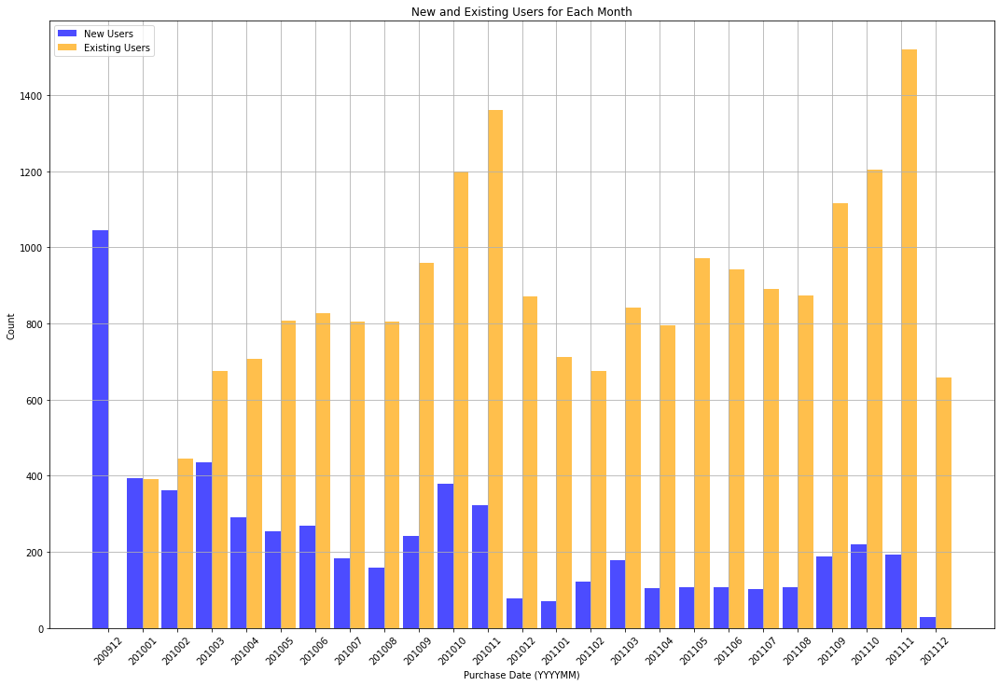

In [0]:

from pyspark.sql import functions as F
import matplotlib.pyplot as plt


# Convert the Spark DataFrame to Pandas DataFrame for local plotting
pandas_df = old_users_df.toPandas()

# Convert 'Purchase_Date' column to numeric type
pandas_df['Purchase_Date'] = pandas_df['Purchase_Date'].astype(int)

# Sort the DataFrame by 'Purchase_Date'
pandas_df = pandas_df.sort_values(by='Purchase_Date')

# Plot the bar chart to show new and existing users for each month
plt.figure(figsize=(15, 10))

# Width of the bars for new and existing users
bar_width = 0.45

# Position of the bars on the x-axis
x_positions = range(len(pandas_df))

# Plot the bars for new users
plt.bar(x_positions, pandas_df['New_Users'], width=bar_width, color='blue', alpha=0.7, label='New Users')

# Plot the bars for existing users beside the new users
plt.bar([pos + bar_width for pos in x_positions], pandas_df['Old_User_Count'], width=bar_width, color='orange', alpha=0.7, label='Existing Users')

# Customize x-axis labels
plt.xticks([pos + bar_width / 2 for pos in x_positions], pandas_df['Purchase_Date'])

plt.xlabel('Purchase Date (YYYYMM)')
plt.ylabel('Count')
plt.title('New and Existing Users for Each Month')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.xticks(rotation=45)
plt.show()
